### HR Analytics Project- Understanding the Attrition in HR
### Problem Statement:
Every year a lot of companies hire a number of employees. The companies invest time and money in training those employees, not just this but there are training programs within the companies for their existing employees as well. The aim of these programs is to increase the effectiveness of their employees. But where HR Analytics fit in this? and is it just about improving the performance of employees?

HR Analytics

Human resource analytics (HR analytics) is an area in the field of analytics that refers to applying analytic processes to the human resource department of an organization in the hope of improving employee performance and therefore getting a better return on investment. HR analytics does not just deal with gathering data on employee efficiency. Instead, it aims to provide insight into each process by gathering data and then using it to make relevant decisions about how to improve these processes.

Attrition in HR

Attrition in human resources refers to the gradual loss of employees overtime. In general, relatively high attrition is problematic for companies. HR professionals often assume a leadership role in designing company compensation programs, work culture, and motivation systems that help the organization retain top employees.

How does Attrition affect companies? and how does HR Analytics help in analyzing attrition? We will discuss the first question here and for the second question, we will write the code and try to understand the process step by step.

Attrition affecting Companies

A major problem in high employee attrition is its cost to an organization. Job postings, hiring processes, paperwork, and new hire training are some of the common expenses of losing employees and replacing them. Additionally, regular employee turnover prohibits your organization from increasing its collective knowledge base and experience over time. This is especially concerning if your business is customer-facing, as customers often prefer to interact with familiar people. Errors and issues are more likely if you constantly have new workers.

### Machine Learning Steps:
    1.Define required libraries with which the model will optmised.
    2.Data Cleansing and Wrangling.
    3.Feature Engineering
    4.Data pre-processing
    5.Feature selection
    6.Split the data into training and testing
    7.Model selection
    8.Model validation
    9.Interpret the results

### Define the required libraries

In [1]:
#as of now we will import pandas library and the remainig will be downloaded at the time of theie requirement
import pandas as pd

### loading the data set

In [2]:
data=pd.read_csv('hr_analytics.csv')

In [3]:
#looking into the data
data.head(10)

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2
5,32,No,Travel_Frequently,1005,Research & Development,2,2,Life Sciences,1,8,...,3,80,0,8,2,2,7,7,3,6
6,59,No,Travel_Rarely,1324,Research & Development,3,3,Medical,1,10,...,1,80,3,12,3,2,1,0,0,0
7,30,No,Travel_Rarely,1358,Research & Development,24,1,Life Sciences,1,11,...,2,80,1,1,2,3,1,0,0,0
8,38,No,Travel_Frequently,216,Research & Development,23,3,Life Sciences,1,12,...,2,80,0,10,2,3,9,7,1,8
9,36,No,Travel_Rarely,1299,Research & Development,27,3,Medical,1,13,...,2,80,2,17,3,2,7,7,7,7


In [4]:
data.shape

(1470, 35)

In [5]:
#understanding the filelds of the data on which the attrition related to.
data.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [6]:
#searching the data samples in each future field
for i in data.columns:
    print(i,'\n',data[i].value_counts(),'\n')

Age 
 35    78
34    77
36    69
31    69
29    68
32    61
30    60
38    58
33    58
40    57
37    50
27    48
28    48
42    46
39    42
45    41
41    40
26    39
44    33
46    33
43    32
50    30
24    26
25    26
47    24
49    24
55    22
53    19
48    19
51    19
52    18
54    18
22    16
56    14
23    14
58    14
21    13
20    11
59    10
19     9
18     8
60     5
57     4
Name: Age, dtype: int64 

Attrition 
 No     1233
Yes     237
Name: Attrition, dtype: int64 

BusinessTravel 
 Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: BusinessTravel, dtype: int64 

DailyRate 
 691     6
1082    5
408     5
329     5
530     5
       ..
708     1
713     1
717     1
719     1
1499    1
Name: DailyRate, Length: 886, dtype: int64 

Department 
 Research & Development    961
Sales                     446
Human Resources            63
Name: Department, dtype: int64 

DistanceFromHome 
 2     211
1     208
10     86
9      85
3      84
7      84

### Data Cleansing and Wrangling.

Removing the unwanted data filling the missing values and changing the data types if required comes as Data Cleansing and Wrangling

In [7]:
# lets load the data set in DataFrame for further anaysis purpose
hra=pd.DataFrame(data)

In [8]:
# obseerving the data in the data set
hra.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

### Observations:
    1.there are 35 fields with 1470 entries in each field
    2.no nan values
    3.26 fileds are int data type and remaining 9 are string data types

### Exploratory Data Anaysis(EDA):
    1.Statistical Analysis
    2.Visual Analysis

In [9]:
# Statistical Analysis
d=hra.describe(include='all')
for i in d:
    print(d.loc[:,i])

count     1470.000000
unique            NaN
top               NaN
freq              NaN
mean        36.923810
std          9.135373
min         18.000000
25%         30.000000
50%         36.000000
75%         43.000000
max         60.000000
Name: Age, dtype: float64
count     1470
unique       2
top         No
freq      1233
mean       NaN
std        NaN
min        NaN
25%        NaN
50%        NaN
75%        NaN
max        NaN
Name: Attrition, dtype: object
count              1470
unique                3
top       Travel_Rarely
freq               1043
mean                NaN
std                 NaN
min                 NaN
25%                 NaN
50%                 NaN
75%                 NaN
max                 NaN
Name: BusinessTravel, dtype: object
count     1470.000000
unique            NaN
top               NaN
freq              NaN
mean       802.485714
std        403.509100
min        102.000000
25%        465.000000
50%        802.000000
75%       1157.000000
max       1499.0

In [10]:
print(hra['Attrition'].dtype)

object


### Observations:
    1.the average age of the employee in the collected data is 37 almost, but std is high means spread of data is high
      high difference between min to 25th percntile, 75th percentile to max values.
    2.dailyrate is having the mean of 802 and at the same time std of 403 very high std
      min value to 25th percentile differnece is high, 75th percentile to max also very high
    3.distance from home is almost mean and std is equal values of 9.1925,8.1068
      Percentile differences are also very high
    4.Education is classification type
    5.employee count is unique value of 1
    6.employee number does not useful in training the model so we will drop in further steps
    7.environmentsatisfaction is of calssification type with 4 classes
    8.hourly rate is 71 categories
    9.JobInvolvement,JobLevel,JobSatisfaction are classification type data
    10.monthly income is having a mean of 6502 and std of 4707 which is very high large differeces are in the percentiles
    11.monthly rate is also having the high difference between the mean , std and percentiles
    12.no of companies worked is calssification type
    13.hike % is having a mean of 15.2 and std of 3.65 and less differences are there between percentiles
    14.performance rating, RelationshipSatisfaction,StandardHours,StockOptionLevel is classification type data
    15.Total Working Years is having mean of 11.2, std of 7.78 which is very high, precentiles are also not uniformly spreaded
    16.TrainingTimesLastYear, worklife balance,years at company,years in current role,years since last promotion are calssification type
    17. year with current manager is having a mean of 4.12 with std of 3.56 which is very high 

### Visual Analysis

before that lets convert the string data into numeric  

In [43]:
# importing the encoders from the sklearn
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
import matplotlib.pyplot as plt
import seaborn as sns

In [44]:
lb=LabelEncoder()
for i in hra.columns:
    if hra[i].dtype==object:
        hra[i]=lb.fit_transform(hra[i])
    

### Univarient Analysis and Bivarient analysis

Bivarient is going to do between the attrition and the remaining future columns

In [16]:
hra.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

<AxesSubplot:>

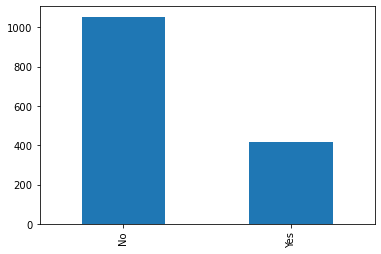

In [12]:
hra['OverTime'].value_counts().plot.bar()

overtime doing is less in employees

<AxesSubplot:>

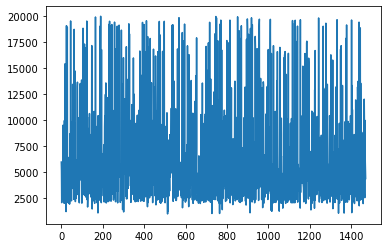

In [13]:
hra['MonthlyIncome'].plot.line()

its in range of 1500 to 19500

<AxesSubplot:xlabel='MonthlyIncome', ylabel='Attrition'>

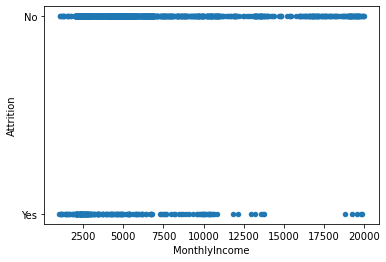

In [14]:
hra.plot.scatter('MonthlyIncome','Attrition')

the attriton rate is less in high salary of monthly income

<AxesSubplot:>

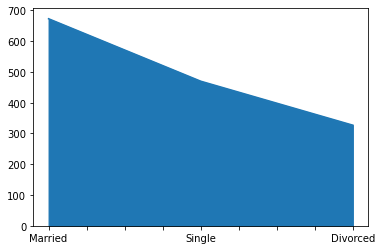

In [15]:
hra['MaritalStatus'].value_counts().plot.area()

married are high follows single and Divorced

<AxesSubplot:xlabel='MaritalStatus', ylabel='Attrition'>

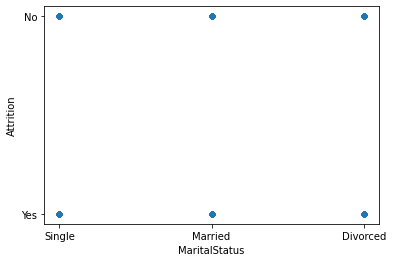

In [16]:
hra.plot.scatter('MaritalStatus','Attrition')

this is also same that the attrition is common in married,single, divorced

<AxesSubplot:>

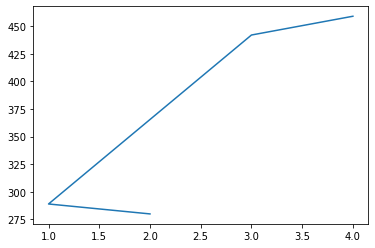

In [17]:
hra['JobSatisfaction'].value_counts().plot.line()

job satisfacion rating of 4 is high followed till 1

<AxesSubplot:xlabel='JobSatisfaction', ylabel='Attrition'>

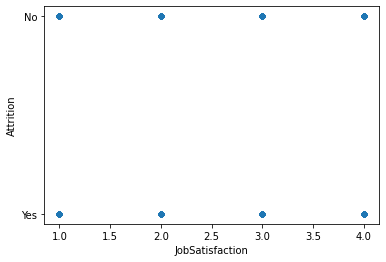

In [18]:
hra.plot.scatter('JobSatisfaction','Attrition')

attrition is common in all this field also

<AxesSubplot:>

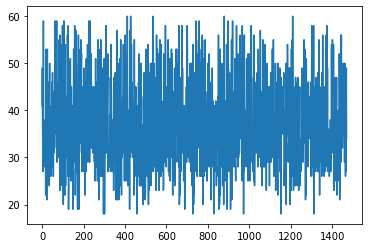

In [19]:
hra['Age'].plot.line()

age is between 18 to 60

<AxesSubplot:xlabel='Age', ylabel='Attrition'>

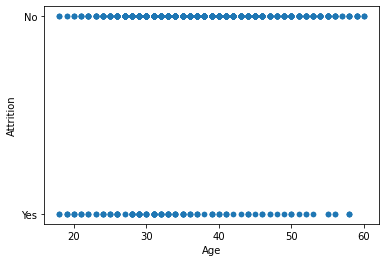

In [20]:
hra.plot.scatter('Age','Attrition')

attrition is common in all age groups we can say but it is less in age of 50 to 60

<AxesSubplot:>

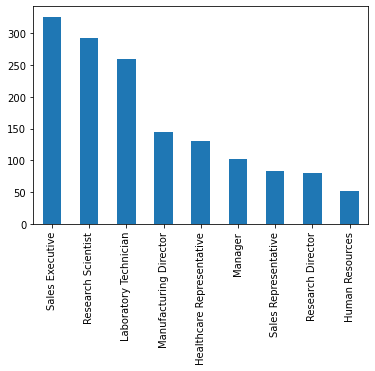

In [21]:
hra['JobRole'].value_counts().plot.bar()

sales executive jobs are high in the collected data set

<AxesSubplot:xlabel='JobRole', ylabel='Attrition'>

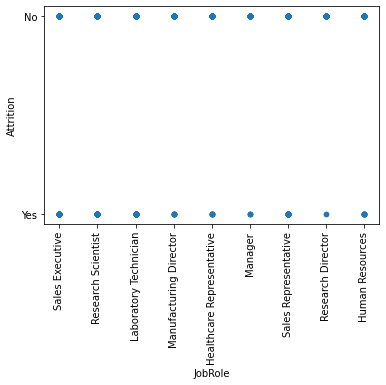

In [22]:
hra.plot.scatter('JobRole','Attrition',rot=90)

attrition is common in all job roles

<AxesSubplot:>

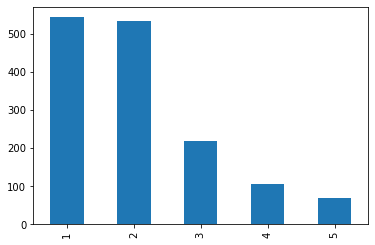

In [23]:
hra['JobLevel'].value_counts().plot.bar()

1 grade jobs count is high follows 2,3,4 and 5

<AxesSubplot:xlabel='JobLevel', ylabel='Attrition'>

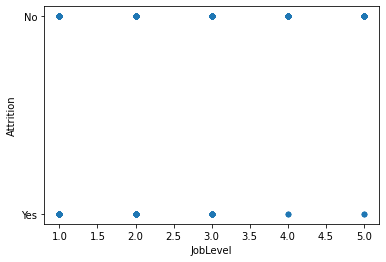

In [24]:
hra.plot.scatter('JobLevel','Attrition')

attrition is common in all job levels

<AxesSubplot:>

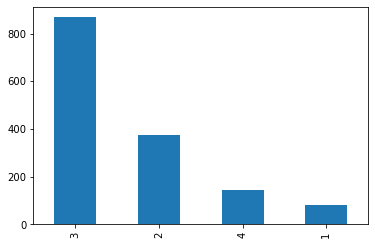

In [25]:
hra['JobInvolvement'].value_counts().plot.bar()

the count of grade 3 is high follows 2 and 4

<AxesSubplot:xlabel='JobInvolvement', ylabel='Attrition'>

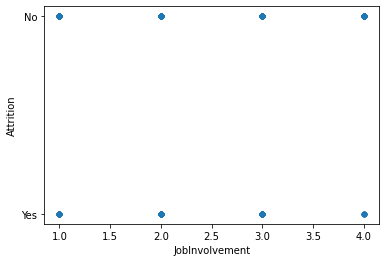

In [26]:
hra.plot.scatter('JobInvolvement','Attrition')

In all job grades this attrition issue exists

<AxesSubplot:>

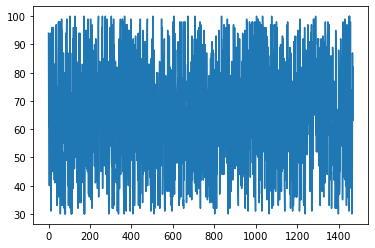

In [27]:
hra['HourlyRate'].plot.line()

its a spread between 30 to 100 

<AxesSubplot:>

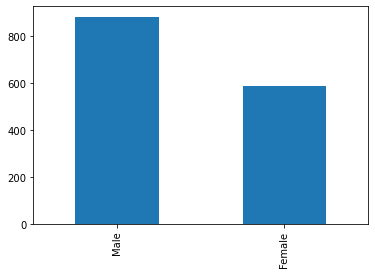

In [28]:
hra['Gender'].value_counts().plot.bar()

male employees are high than the female employees

<AxesSubplot:>

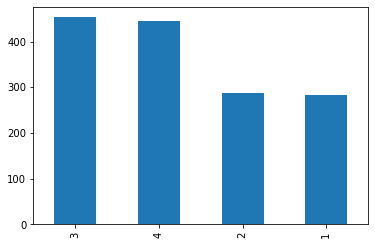

In [29]:
hra['EnvironmentSatisfaction'].value_counts().plot.bar()

3 grade is highest follows 4

<AxesSubplot:>

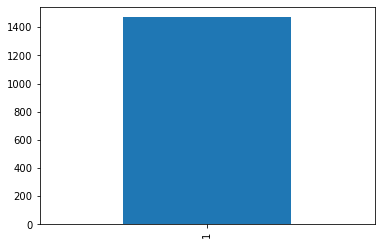

In [30]:
hra['EmployeeCount'].value_counts().plot.bar()

total employees in the collected data set

<AxesSubplot:>

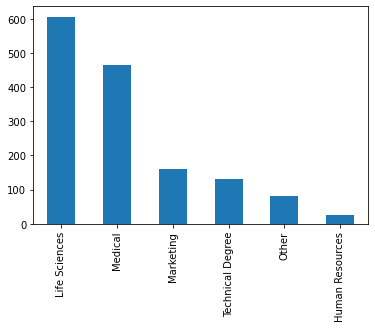

In [31]:
hra['EducationField'].value_counts().plot.bar()

life sciences is the highest in this filed

<AxesSubplot:>

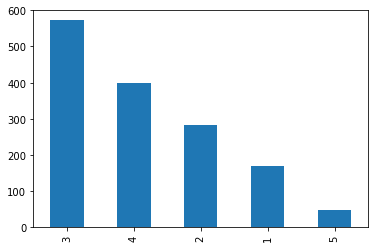

In [32]:
hra['Education'].value_counts().plot.bar()

grade 3 education count is high

<AxesSubplot:>

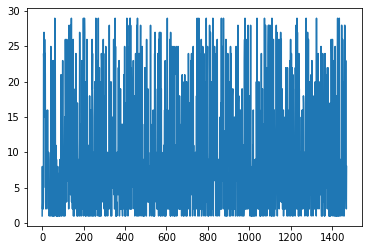

In [33]:
hra['DistanceFromHome'].plot.line()

it falls between 1 to 28

<AxesSubplot:>

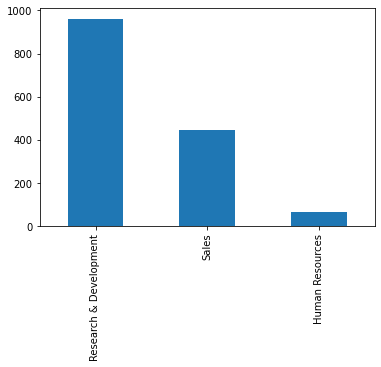

In [34]:
hra['Department'].value_counts().plot.bar()

the data is majorly for three departments

<AxesSubplot:>

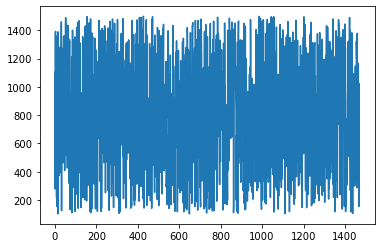

In [35]:
hra['DailyRate'].plot.line()

daily rate is spread of range 120 to 1450

<AxesSubplot:>

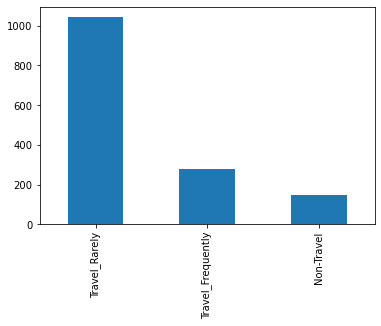

In [36]:
hra['BusinessTravel'].value_counts().plot.bar()

travelling employees are high compared to not traveling till now

<AxesSubplot:>

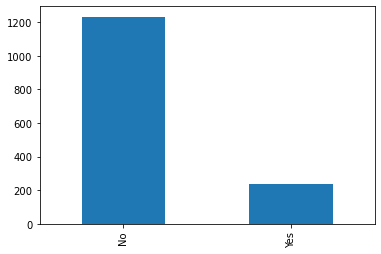

In [37]:
hra['Attrition'].value_counts().plot.bar()

Attrition yes(1) rate is less comapred to no(0)

In [42]:
hra['Attrition'].min()

'No'

### Featuring Engineering

converting the data into other types, adding or removing of columns are comes under featur engineering
in the above fields some data is continuoes data type where rest are classification type
so we will convert them classification type data by taking some conditions

In [39]:
d=hra.describe()
for i in d:
    print(d.loc[:,i])

count    1470.000000
mean       36.923810
std         9.135373
min        18.000000
25%        30.000000
50%        36.000000
75%        43.000000
max        60.000000
Name: Age, dtype: float64
count    1470.000000
mean      802.485714
std       403.509100
min       102.000000
25%       465.000000
50%       802.000000
75%      1157.000000
max      1499.000000
Name: DailyRate, dtype: float64
count    1470.000000
mean        9.192517
std         8.106864
min         1.000000
25%         2.000000
50%         7.000000
75%        14.000000
max        29.000000
Name: DistanceFromHome, dtype: float64
count    1470.000000
mean        2.912925
std         1.024165
min         1.000000
25%         2.000000
50%         3.000000
75%         4.000000
max         5.000000
Name: Education, dtype: float64
count    1470.0
mean        1.0
std         0.0
min         1.0
25%         1.0
50%         1.0
75%         1.0
max         1.0
Name: EmployeeCount, dtype: float64
count    1470.000000
mean     1024.

In [45]:
sns.set(font_scale=2)
sns.pairplot(hra,height=5,aspect=1,corner=False)

Observations:
    from the pair plot w can see that the attrition was dependent on all the independent variables like 
    job level, age, education, job position, monthly income, wage rates, hike, marita status etc,.

### checking for outliers in the continuous data

by calculating the z score 
we filter the z score greater than 3

Before that lets see the outliers in the data

Age                            AxesSubplot(0.125,0.787927;0.133621x0.0920732)
Attrition                   AxesSubplot(0.285345,0.787927;0.133621x0.0920732)
BusinessTravel               AxesSubplot(0.44569,0.787927;0.133621x0.0920732)
DailyRate                   AxesSubplot(0.606034,0.787927;0.133621x0.0920732)
Department                  AxesSubplot(0.766379,0.787927;0.133621x0.0920732)
DistanceFromHome               AxesSubplot(0.125,0.677439;0.133621x0.0920732)
Education                   AxesSubplot(0.285345,0.677439;0.133621x0.0920732)
EducationField               AxesSubplot(0.44569,0.677439;0.133621x0.0920732)
EmployeeCount               AxesSubplot(0.606034,0.677439;0.133621x0.0920732)
EmployeeNumber              AxesSubplot(0.766379,0.677439;0.133621x0.0920732)
EnvironmentSatisfaction        AxesSubplot(0.125,0.566951;0.133621x0.0920732)
Gender                      AxesSubplot(0.285345,0.566951;0.133621x0.0920732)
HourlyRate                   AxesSubplot(0.44569,0.566951;0.1336

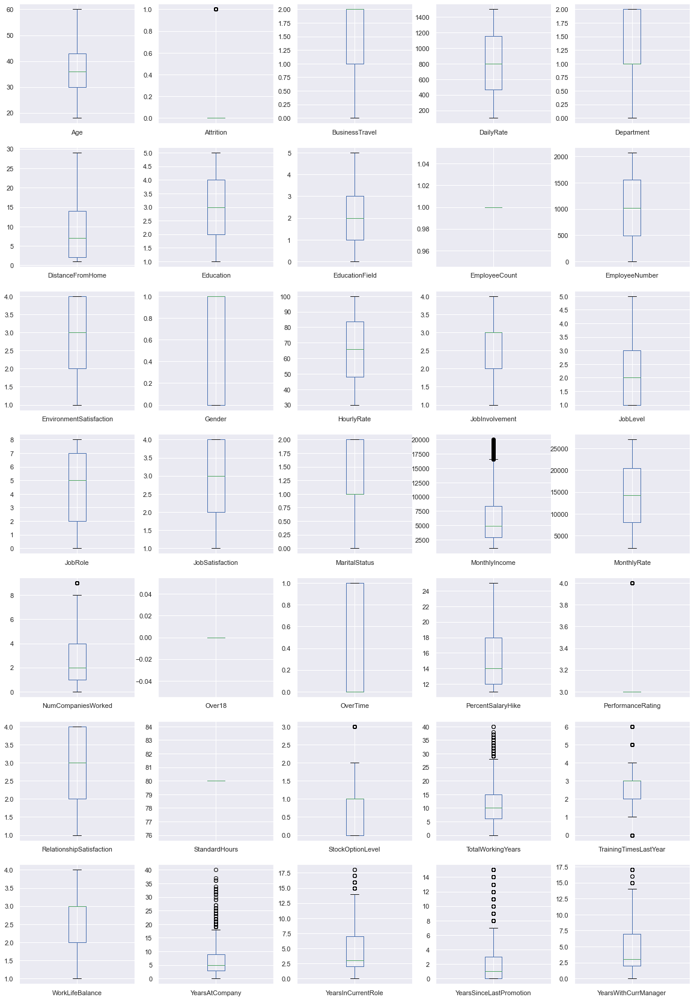

In [155]:
#box plot will use to see the outliers in the data set
sns.set(font_scale=1)
hra.plot(kind='box',subplots=True, layout=(7,5), figsize=(20,30))

### observations:
    1.few outliers in MonthlyIncome
    2.one outlier in no of companies worked, PerformanceRating, Stockoption Level
    3.total working years have outliers.
    4.Training Times Last Year also have outliers
    5.Years at company have outliers
    6.YearsCurrentRole, Years Since Last Promotion, Years with Current Managers fields have outliers too.

In [156]:
# importing the numpy library and stats library
# we have to convert the string data to numeric data
from scipy.stats import zscore
import numpy as np

In [174]:
zs=np.abs(zscore(hra))

In [182]:
threshold=3
np.where(zs>3)

(array([  28,   45,   62,   62,   63,   64,   85,   98,   98,  110,  123,
         123,  123,  126,  126,  126,  153,  178,  187,  187,  190,  190,
         218,  231,  231,  237,  237,  270,  270,  281,  326,  386,  386,
         401,  411,  425,  425,  427,  445,  466,  473,  477,  535,  561,
         561,  584,  592,  595,  595,  595,  616,  624,  635,  653,  653,
         677,  686,  701,  716,  746,  749,  752,  799,  838,  861,  861,
         875,  875,  894,  914,  914,  918,  922,  926,  926,  937,  956,
         962,  976,  976, 1008, 1024, 1043, 1078, 1078, 1086, 1086, 1093,
        1111, 1116, 1116, 1135, 1138, 1138, 1156, 1184, 1221, 1223, 1242,
        1295, 1301, 1301, 1303, 1327, 1331, 1348, 1351, 1401, 1414, 1430],
       dtype=int64),
 array([34, 33, 31, 33, 32, 33, 28, 28, 31, 33, 32, 33, 34, 28, 31, 33, 34,
        33, 28, 34, 31, 32, 33, 32, 34, 31, 33, 28, 31, 32, 33, 33, 34, 28,
        31, 31, 33, 33, 28, 32, 31, 31, 33, 31, 34, 33, 31, 28, 31, 33, 34,
        28

In [252]:
# taking the data set with out outliers
hra2=hra[(zs<=3).all(axis=1)]

### Checking the skewness and removing it

In [253]:
hra2.head(2)

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,2,1102,2,1,2,1,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,0,1,279,1,8,1,1,1,2,...,4,80,1,10,3,3,10,7,1,7


we are going to check the skewness of the continuos data type of future columns  Age, DailyRate, StandardHours,
Total Working Years, Training Times Last Year, Years at Company,  Years In Current Role, Years Since Last Promotion
Years With Cuurent Manager

In [254]:
# importing the required libraries
from scipy.stats import boxcox 
from sklearn.preprocessing import power_transform

C:\Users\smahi\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='YearsWithCurrManager', ylabel='Density'>

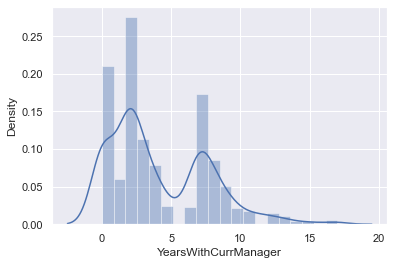

In [255]:
sns.distplot(hra2.YearsWithCurrManager)

rightskewed

In [256]:
d1=np.array(hra2.YearsWithCurrManager)
hra2.YearsWithCurrManager=power_transform(d1.reshape(-1,1))

C:\Users\smahi\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='YearsSinceLastPromotion', ylabel='Density'>

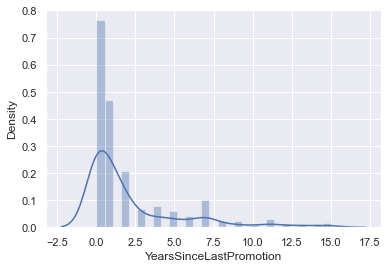

In [257]:
sns.distplot(hra2.YearsSinceLastPromotion)

rightskewed

In [258]:
d1=np.array(hra2.YearsSinceLastPromotion)
hra2.YearsSinceLastPromotion=power_transform(d1.reshape(-1,1))

C:\Users\smahi\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='YearsInCurrentRole', ylabel='Density'>

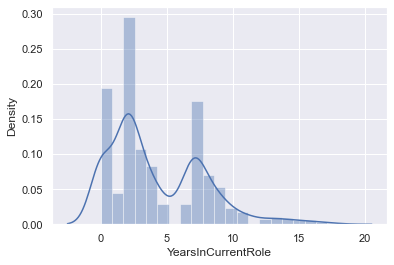

In [259]:
sns.distplot(hra2.YearsInCurrentRole)

skewness on both sides

In [260]:
d1=np.array(hra2.YearsInCurrentRole)
hra2.YearsInCurrentRole=power_transform(d1.reshape(-1,1))

C:\Users\smahi\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='YearsAtCompany', ylabel='Density'>

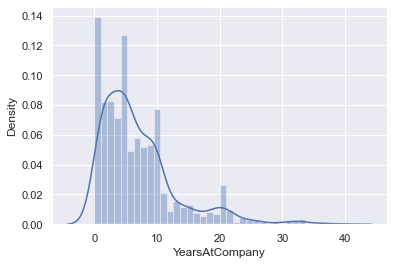

In [261]:
sns.distplot(hra2.YearsAtCompany)

rightskewed

In [262]:
d1=np.array(hra2.YearsAtCompany)
hra2.YearsAtCompany=power_transform(d1.reshape(-1,1))

C:\Users\smahi\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='TrainingTimesLastYear', ylabel='Density'>

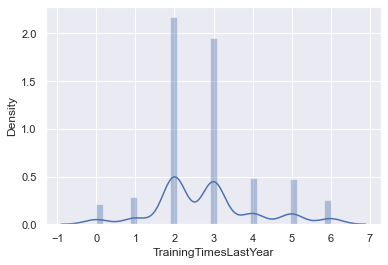

In [263]:
sns.distplot(hra2.TrainingTimesLastYear)

skeweness on both sides

In [264]:
d1=np.array(hra2.TrainingTimesLastYear)
hra2.TrainingTimesLastYear=power_transform(d1.reshape(-1,1))

C:\Users\smahi\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='TotalWorkingYears', ylabel='Density'>

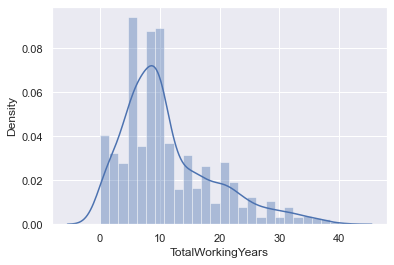

In [265]:
sns.distplot(hra2.TotalWorkingYears)

Rightskewed

In [266]:
d1=np.array(hra2.TotalWorkingYears)
hra2.TotalWorkingYears=power_transform(d1.reshape(-1,1))

C:\Users\smahi\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='DailyRate', ylabel='Density'>

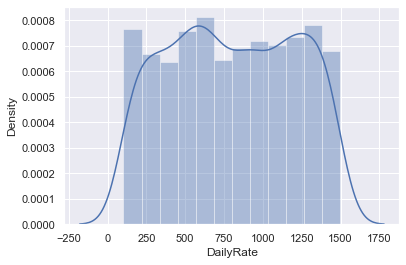

In [267]:
sns.distplot(hra2['DailyRate'])

More skewness is there

In [268]:
hra2.DailyRate=boxcox(hra2.DailyRate,0.5)

C:\Users\smahi\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='Age', ylabel='Density'>

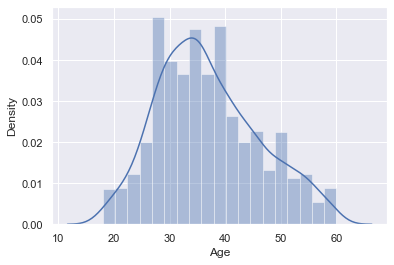

In [269]:
sns.distplot(hra2['Age'])

very slight skewness in this data

In [270]:
hra2['Age']=boxcox(hra['Age'],0.5)

### Checking the correlation

In [271]:
hra2.corr()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Age,1.000000,-0.170242,0.022009,0.006077,-0.031682,-0.001098,0.218897,-0.045161,NaN,-0.006091,...,0.050533,NaN,0.044662,0.685035,-0.016998,-0.019944,0.288639,0.208398,0.179234,0.198110
Attrition,-0.170242,1.000000,0.000074,-0.054566,0.063991,0.077924,-0.031373,0.026846,NaN,-0.010577,...,-0.045872,NaN,-0.137145,-0.214827,-0.061284,-0.063939,-0.193406,-0.182921,-0.054479,-0.182957
BusinessTravel,0.022009,0.000074,1.000000,-0.006871,-0.009044,-0.024469,0.000757,0.023724,NaN,-0.015578,...,-0.035986,NaN,-0.016727,0.036349,0.016732,-0.011256,-0.011451,-0.021166,-0.029513,-0.018747
DailyRate,0.006077,-0.054566,-0.006871,1.000000,0.009632,-0.010350,-0.017249,0.036486,NaN,-0.046403,...,0.010338,NaN,0.045804,0.019349,0.000532,-0.039501,-0.013097,0.011699,-0.038250,-0.004660
Department,-0.031682,0.063991,-0.009044,0.009632,1.000000,0.017225,0.007996,0.013720,NaN,-0.010895,...,-0.022414,NaN,-0.012193,-0.007843,0.039854,0.026383,0.020385,0.051018,0.019688,0.025060
DistanceFromHome,-0.001098,0.077924,-0.024469,-0.010350,0.017225,1.000000,0.021042,0.002013,NaN,0.032916,...,0.006557,NaN,0.044872,0.015166,-0.036379,-0.026556,0.016778,0.025124,0.010353,0.005335
Education,0.218897,-0.031373,0.000757,-0.017249,0.007996,0.021042,1.000000,-0.039592,NaN,0.042070,...,-0.009118,NaN,0.018422,0.169440,-0.022940,0.009819,0.062872,0.058443,0.031051,0.057063
EducationField,-0.045161,0.026846,0.023724,0.036486,0.013720,0.002013,-0.039592,1.000000,NaN,-0.002516,...,-0.004378,NaN,-0.016185,-0.020039,0.047971,0.041191,-0.003813,0.000175,0.010689,0.010450
EmployeeCount,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EmployeeNumber,-0.006091,-0.010577,-0.015578,-0.046403,-0.010895,0.032916,0.042070,-0.002516,NaN,1.000000,...,-0.069861,NaN,0.062227,-0.006478,0.024664,0.010309,0.009961,-0.001340,0.008521,-0.002387


In [272]:
#droping of the columns that are not affecting the output column
hra3=hra2.drop(['Over18','StandardHours','EmployeeCount'],axis=1)

In [ ]:
cl=['Age','Attrition','DailyRate','TotalWorkingYears','TrainingTimesLastYear','YearsAtCompany','YearsInCurrentRole','YearsSinceLastPromotion','YearsWithCurrManager']

<AxesSubplot:>

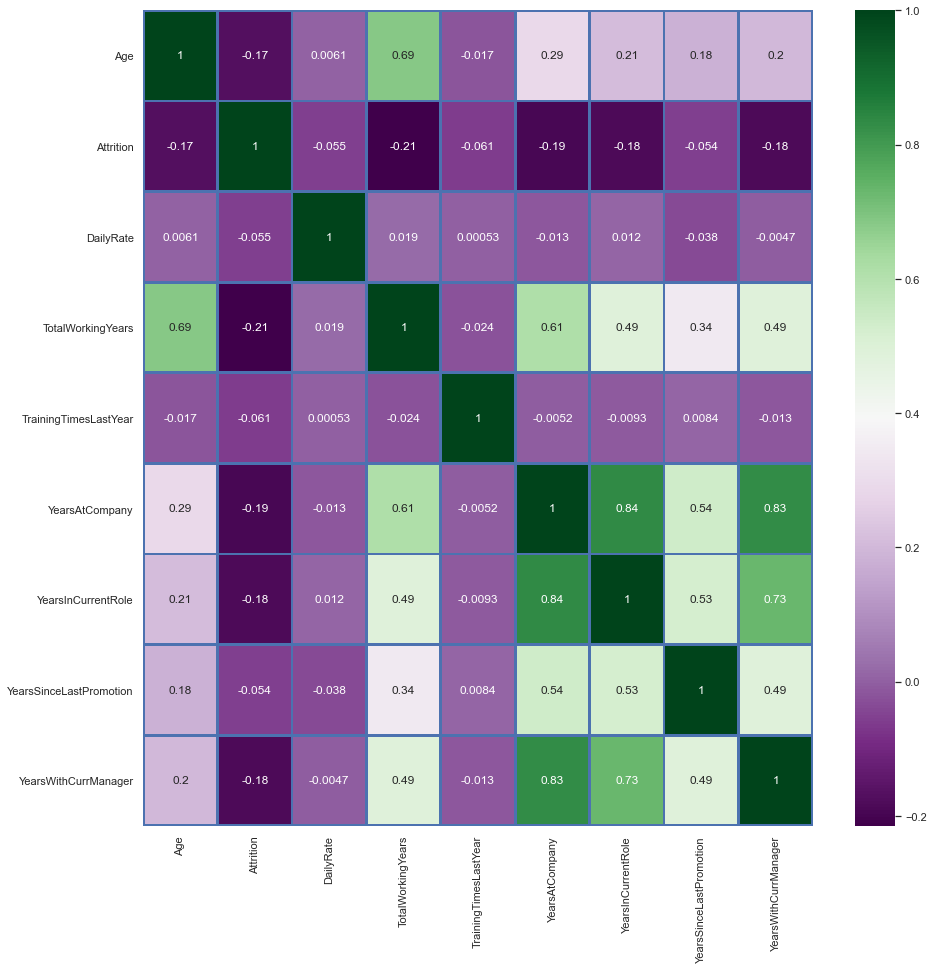

In [283]:
plt.figure(figsize=(15,15))
sns.heatmap(hra3[['Age','Attrition','DailyRate','TotalWorkingYears','TrainingTimesLastYear','YearsAtCompany','YearsInCurrentRole','YearsSinceLastPromotion','YearsWithCurrManager']].corr(),annot=True, cmap='PRGn', linewidths=2,linecolor='b')

### Observations:
    attrition is very less corelated to YearsSinceLastPromotion,TrainingTimesLastYear and DailyRate
    we are going to drop them
    

In [291]:
hra3.drop(['YearsSinceLastPromotion','TrainingTimesLastYear','DailyRate'], axis=1,inplace=True)

checking the variance in the continuous data

In [284]:
# importing the required liibraries
import statsmodels.api as sm
from scipy import stats
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [292]:
x=hra3[['Age','Attrition','TotalWorkingYears','YearsInCurrentRole','YearsWithCurrManager']]

In [ ]:
vf=pd.DataFrame()
vf['column_names']=x.columns
vf['VIF Values']=[variance_inflation_factor(x.values,n) for n in range(x.shape[1])]
vf.sort_values(by='VIF Values', ascending=False, inplace=True, ignore_index=True)
print(vf)
vf.plot.bar(x='column_names', y='VIF Values',stacked=True, subplots=True, rot=90)

In [ ]:
Observations:
    YearsInCurrentRole is having the highest inflation
    we are going to drop that column

In [294]:
hra3.drop(['YearsInCurrentRole'],axis=1,inplace=True)

In [299]:
hra3.head(2)

,Age,Attrition,BusinessTravel,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,Gender,...,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,WorkLifeBalance,YearsAtCompany,YearsWithCurrManager
0,10.806248,1,2,2,1,2,1,1,2,0,...,8,1,11,3,1,0,-0.244305,1,0.139692,0.490147
1,12.000000,0,1,1,8,1,1,2,3,1,...,1,0,23,4,4,1,0.052495,3,0.762660,0.909635


### Scaling

Age is the only variable with the value not in between 1 and 0
by using the scaling technique we will reduce the magnitude of the age column

In [300]:
#importing minmax scaler
from sklearn.preprocessing import MinMaxScaler, StandardScaler
#minamx scaler reduce the value of data in between 0 and 1

In [303]:
scale=MinMaxScaler()

In [312]:
d=np.array(hra3['Age'])
d=d.reshape(-1,1)
d.shape,hra3.Age.shape

In [313]:
hra3.Age.shape,d.shape

((1470,), (1470, 1))

In [314]:
scale.fit(d)
scale.transform(d)

array([[0.61669498],
       [0.787069  ],
       [0.52524996],
       ...,
       [0.27217328],
       [0.787069  ],
       [0.45337237]])

### after scaling data set balancing is the next step

In [393]:
# before that we have tosplit the target variables and future variables
# target variable
y=hra3.iloc[:,1]
# future variables
x=pd.concat([hra3.iloc[:,0],hra3.iloc[:,2:]],axis=1,ignore_index=True)

In [394]:
x.shape,y.shape # before balancing the data set

((1470, 27), (1470,))

In [395]:
# importing the required library
from imblearn.over_sampling import SMOTE
x, y = SMOTE().fit_resample(x, y)

In [396]:
x.shape,y.shape # after balancing the data set

((2466, 27), (2466,))

### model selection

since the output is binary i.e., 0 or 1 we can use any 4 classification type models including logistic regression

In [397]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_curve, roc_auc_score
from sklearn.model_selection import cross_val_score

In [398]:
lr,rf,ac,dt=LogisticRegression(),RandomForestClassifier(),AdaBoostClassifier(),DecisionTreeClassifier()

### hyper perameter tuning

Hyper parameter tuning is nothing but the finding the correct parameters of a model so the model can perform at it highest performance state

In [399]:
# for that we are going to import 
from sklearn.model_selection import GridSearchCV

In [405]:

#creating perameters
model_par={
           lr:{'model':lr,'param':{'penalty':['l1', 'l2', 'elasticnet', 'none'],'solver':['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']}},
    rf:{'model':rf,'param':{'n_estimators':[100,125,150,200],'criterion':["gini", "entropy"],'min_samples_split':[2,2.5,3,3.5]}},
    ac:{'model':ac,'param':{'n_estimators':[50,100,150,200],'learning_rate':[1,2,3,4],'algorithm':['SAMME', 'SAMME.R']}},
    dt:{'model':dt,'param':{'criterion':["gini", "entropy"],'splitter':['best','random'],'min_samples_leaf':[1,2,3]}}
           }
scores=[]
for model_name, mp in model_par.items():
    model_selection=GridSearchCV(estimator=mp['model'],param_grid=mp['param'],cv=5,return_train_score=False)
    model_selection.fit(x,y)
    scores.append({'model':model_name,'best_score':model_selection.best_score_,'best_params':model_selection.best_params_})
scores

[{'model': LogisticRegression(),
  'best_score': 0.7729837153345214,
  'best_params': {'penalty': 'l2', 'solver': 'newton-cg'}},
 {'model': RandomForestClassifier(),
  'best_score': 0.8147276445130613,
  'best_params': {'criterion': 'gini',
   'min_samples_split': 3,
   'n_estimators': 100}},
 {'model': AdaBoostClassifier(),
  'best_score': 0.6963390298182655,
  'best_params': {'algorithm': 'SAMME.R',
   'learning_rate': 2,
   'n_estimators': 50}},
 {'model': DecisionTreeClassifier(),
  'best_score': 0.7749809067840455,
  'best_params': {'criterion': 'entropy',
   'min_samples_leaf': 1,
   'splitter': 'random'}}]

#### Observation:
        from the above output we can see that the RandomForestClassifier() is best model with criterian gini,n_estimator=100    and min_samples_split=3 
        so we are going to train this model for best accuracy

In [407]:
rf=RandomForestClassifier(criterion='gini',min_samples_split=3,n_estimators=100)

the model performs best at random state 145 with test acc 0.8486486486486486 train acc 1.0 cross validation score 57.94809407948094
test accuracy_score of 0.918918918918919
test roc_auc_score of 0.974753225296486
train accuracy_score of 0.9391480730223124
train roc_auc_score of 0.9849633977445096
cross validation score 56.60989456609895
confusion_matrix of 
 [[671  48]
 [ 72 689]]
classification_report of 
               precision    recall  f1-score   support

           0       0.90      0.93      0.92       719
           1       0.93      0.91      0.92       761

    accuracy                           0.92      1480
   macro avg       0.92      0.92      0.92      1480
weighted avg       0.92      0.92      0.92      1480



Text(0.5, 1.0, 'ROC Curve')

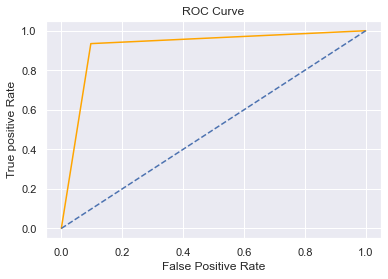

In [416]:
tep,trp,cv,I=[],[],[],[]
for i in range(1,300):
    xtrain,xtest,ytrain,ytest=train_test_split(x,y,test_size=0.6, random_state=i)
    rf.fit(xtrain,ytrain)
    test_pre=rf.predict(xtest)
    train_pre=rf.predict(xtrain)
    Tep=accuracy_score(ytest,test_pre)
    Trp=accuracy_score(ytrain,train_pre)
    Cv=cross_val_score(rf,x,y,cv=3).mean()*100
    tep.append(Tep)
    trp.append(Trp)
    cv.append(Cv)
    I.append(i)
    
values=pd.DataFrame({'Test_acc':tep,'Train_acc':trp,'Cross_validation_score':cv,'random_state':I})
values.sort_values(by='Test_acc',inplace=True,ignore_index=True)
print('the model performs best at random state',values.iloc[0,3],'with test acc',values.iloc[0,0],'train acc',values.iloc[0,1],'cross validation score',values.iloc[0,2])
xtrain,xtest,ytrain,ytest=train_test_split(x,y,test_size=0.6, random_state=values.iloc[0,3])
test_pre=rf.predict(xtest)
train_pre=rf.predict(xtrain)
test_pre_prob=rf.predict_proba(xtest)
train_pre_prob=rf.predict_proba(xtrain)
print("test accuracy_score of",accuracy_score(ytest,test_pre))
print("test roc_auc_score of", roc_auc_score(ytest,test_pre_prob[:,1]))
print("train accuracy_score of",accuracy_score(ytrain,train_pre))
print("train roc_auc_score of", roc_auc_score(ytrain,train_pre_prob[:,1]))
print("cross validation score", cross_val_score(rf,x,y,cv=3).mean()*100)
print("confusion_matrix of",'\n', confusion_matrix(ytest,test_pre))
print("classification_report of",'\n',classification_report(ytest,test_pre))
fpr,tpr,tr=roc_curve(test_pre, ytest)
plt.plot(fpr,tpr,color='orange')
plt.plot([0,1],[0,1],linestyle='--')
plt.xlabel("False Positive Rate")
plt.ylabel("True positive Rate")
plt.title("ROC Curve")

In [417]:
#model saving
import pickle
filename='hr_analytics.pkl'
pickle.dump(rf,open(filename,'wb'))